<center>
    <h1>Fruit Inspection - First Task: Fruit Segmentation and Defect Detection</h1>
    <h2>Image Processing and Computer Vision</h2>
    <h3>Facundo Nicolas Maidana and Riccardo Spolaor</h3>
    <h4>facundo.maidana@studio.unibo.it; riccardo.spolaor@studio.unibo.it</h4>
</center>

---

This notebook presents the development of a system aimed at locating defects and imperfection in fruits. Each fruit is acquired through a NIR *(Near Infra-Red)* and color camera that present little parallax effect among each other.

The first task considers the images in the folder `images/first task/`, that present apples with external defects which are clearly visible.

| NIR example                   | Colour example                |
|:-----------------------------:|:-----------------------------:|
| 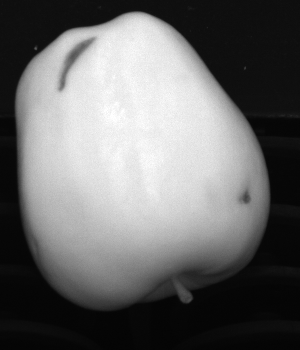 | 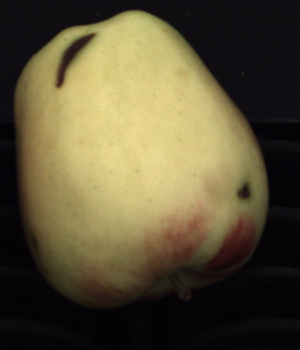 |

In order to localize these defects two steps have to be carried out:
- Each fruit should be outlined by means of a binary mask that separates the foreground (the fruit) from the background. This step is performed through a thresholding technique;
- A search to identify the defects on the fruit must be carried out on the outlined portion of the image.

*Note: given the fact that NIR and color images have little parallax, a mask can be computed on one and applied to the other.*

#### Procedure
Although this is an academic project, the working pipeline has been developed considering an industrial setting where the inspection of the fruits has to be carried out by an *online* system. A set of methods have been tested in terms of quality, speed and robustness.

# 00 Prerequisites
The libraries necessary for the task are imported.

In [1]:
%matplotlib inline

import cv2 as cv
import math
import matplotlib.pyplot as plt
import numpy as np
import sys
from time import time

# Utils libraries
from execute_first_task import detect_defects

from utils.edge import *
from utils.general import *
from utils.threshold import *

The cell below illustrates the version of `OpenCV` used for the task.

In [2]:
print(f'Using OpenCV version: {cv.__version__}.')

Using OpenCV version: 4.6.0.


The random seed is set for both the `numpy` and `OpenCV` libraries in order to guarantee reproducibility of results.

In [3]:
SEED = 42

cv.setRNGSeed(SEED)
np.random.seed(SEED)

# 01 Image analysis 
The series of images is firstly imported and plotted.

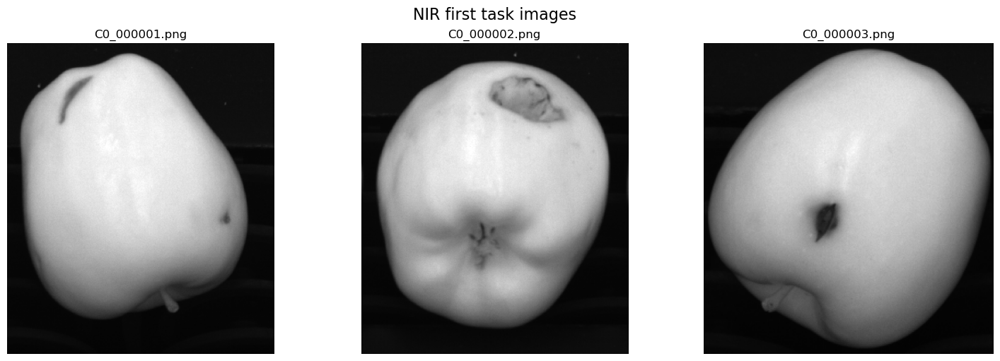

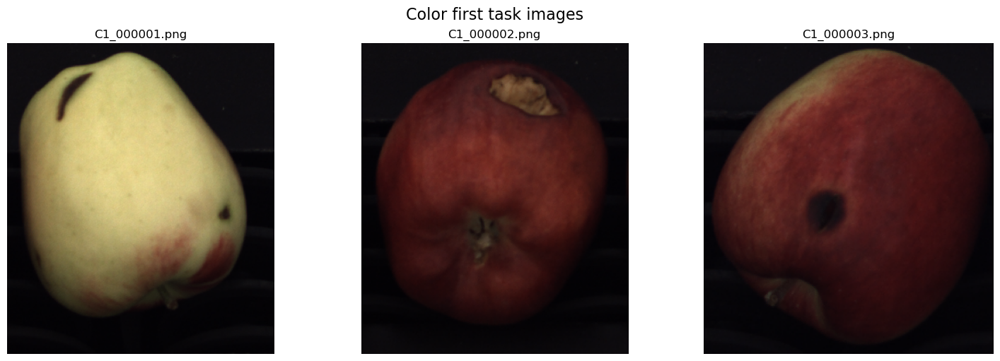

In [4]:
# Create two arrays containing the names of the NIR and color images respectively
nir_names, colour_names = [[f'C{j}_00000{i}.png' for i in range(1,4)] for j in [0,1]]

# Directory where the images are saved
DIR = '../images/first task/'

# Import NIR and color images
nir_imgs = [cv.imread(f'{DIR}{img}', cv.IMREAD_GRAYSCALE) for img in nir_names]
colour_imgs = [cv.imread(f'{DIR}{img}') for img in colour_names]

# Plot the NIR and color images
plot_image_grid(nir_imgs, nir_names, 'NIR first task images')
plot_image_grid(colour_imgs, colour_names, 'Color first task images')

Then, the parallax between images is observed. The NIR and colour images seem to overlap almost perfectly, therefore the NIR version of the images can be used to obtain the binary masks of the fruit which can be applied even on their colour version.

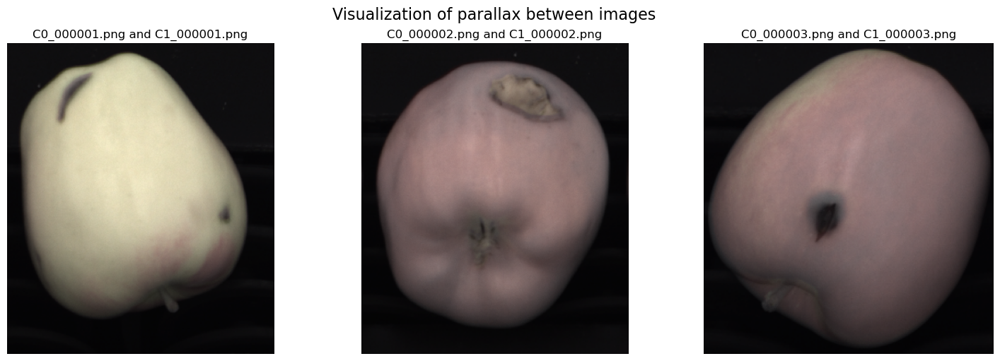

In [5]:
parallaxes = [cv.addWeighted(cv.cvtColor(n, cv.COLOR_GRAY2BGR), 0.5, c, 0.5, 0) 
              for n, c in zip(nir_imgs, colour_imgs)]

plot_image_grid(parallaxes, [f'{n} and {c}' for n, c in zip(nir_names, colour_names)], 
                'Visualization of parallax between images')

Next, the *gray-level histograms* of the three NIR images are computed and shown.

By observing the results we can identify a greater concentration of pixels around the interval $[0, 50]$, which should correspond to background pixels. Moreover, other small peaks are present around higher values for the gray levels, which should represent foreground pixels belonging to the fruit. 

Unfortunately, the distribution of background and foreground pixels is slightly different among the three images. Furthermore the istograms are not clearly *bimodal* and an actual treshold that binarizes the image cannot be trivially identified. It can be observed that image `C0_000003.png` presents an even more confusing separation among background and foreground pixels.

These outcomes should be expected since the NIR images shown above are not *inherently binary*. The shadowy areas due to the lighting variations and the presence of the defects and textures on the fruit are the main reasons of the lack of bimodality in the histogram.

Furthermore, sources of noise may be another impacting factor, in fact, some of the tresholding algorithms presented in the next section consider image preprocessing.

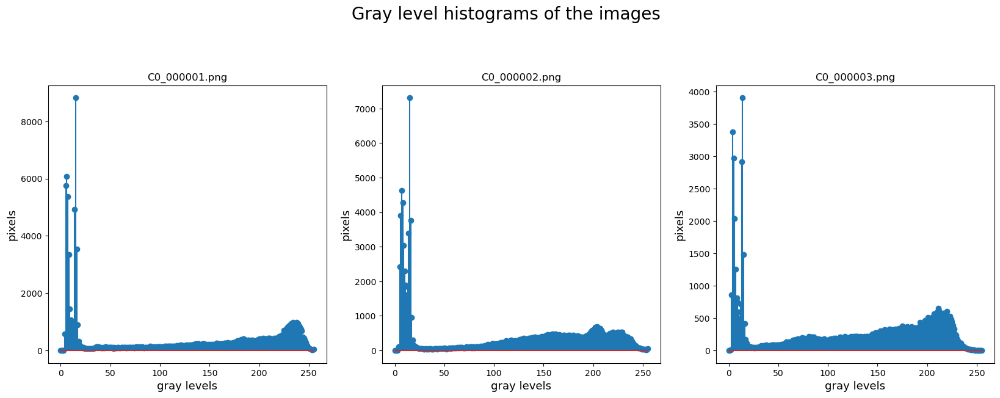

In [6]:
plot_histogram_grid(nir_imgs, nir_names, 'Gray level histograms of the images')

## 02 Preprocessing
In order to guarantee better performances during the binarization tasks a pre-processing operation has been applied to the NIR images to remove unwanted noisy signals and smooth them.

More specifically, the following filters have been considered and tested: 
- A *Median blur* non-linear filter using a kernel of dimension $(3 \times 3)$
- A *Bilateral filter* using kernel of dimension $(7 \times 7)$ and spatial standard deviation ($\sigma_s$) and intensity standard deviation ($\sigma_r$) equal to $75$.

The reason behind the choice of these filters is that they are able to preserve the edges of the images during their denoising operations. Edge preservation is important in order to obtain a binary mask that has a good precision in outlining the fruits.

Moreover, Median filters are effective in removing impulse noisy signal, which can be traced back to the small lighter artifacts in the background of the images.

On the other hand, Bilateral filters can remove Gaussian-like noise, a result which cannot be obtained with Median filters.

The results are in line with the observation above, as the images are denoised while the edges are preserved and the artifacts on the background are partially removed.

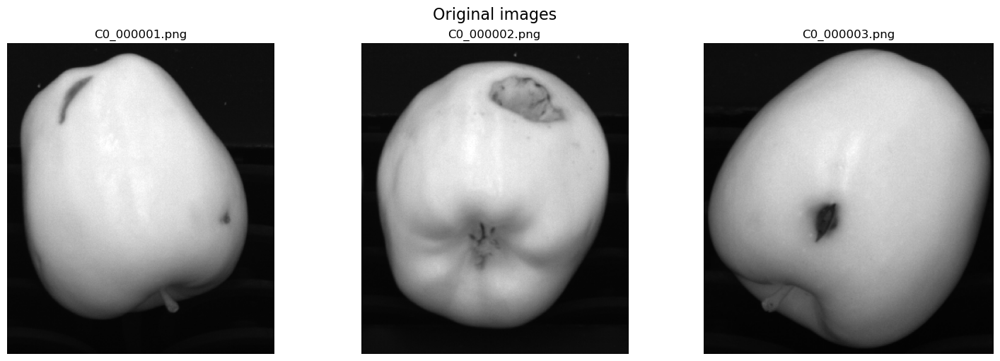

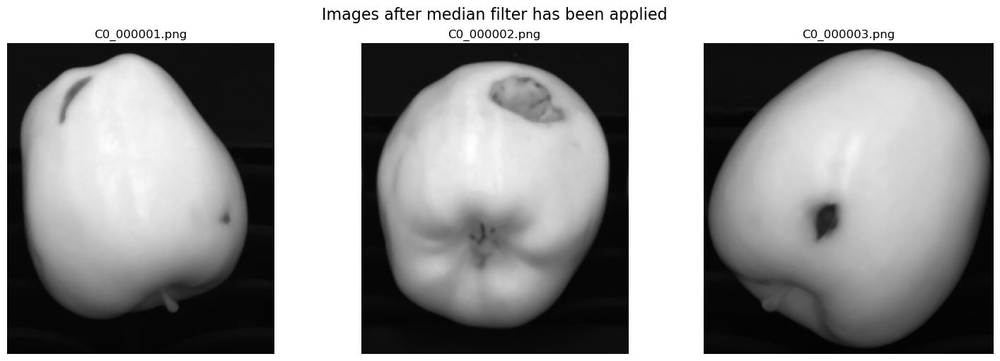

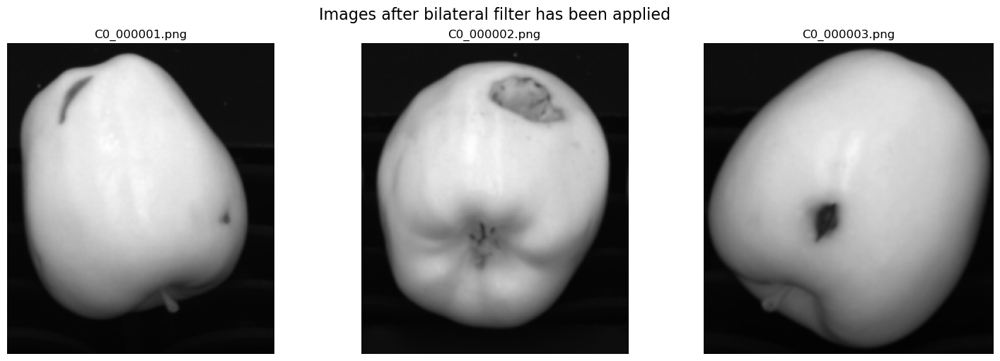

In [7]:
median_images = [cv.medianBlur(img,5) for img in nir_imgs]
bil_images = [cv.bilateralFilter(img, d=5, sigmaColor=75, sigmaSpace=75) for img in nir_imgs]

plot_image_grid(nir_imgs, nir_names, 'Original images')
plot_image_grid(median_images, nir_names, 'Images after median filter has been applied')
plot_image_grid(bil_images, nir_names, 'Images after bilateral filter has been applied')

In [8]:
s = time()
for img in nir_imgs * 1_000:
    cv.medianBlur(img,5)
median_time = time() - s

s = time()
for img in nir_imgs * 1_000:
    cv.bilateralFilter(img, d=7, sigmaColor=75, sigmaSpace=75)
bilateral_time = time() - s

The two filters have been tested on the set of images for a total of $3,000$ times. 
It is evident how the median filter is faster, hence preferred to the bilateral filter.

Moreover, the elimination of Gaussian-like noise, naturally presented in the images, is not deemed as necessary for the segmentation process, since small variations of intensity may not be considered impacting in the results.

In [9]:
print(f'Time for preprocessing {1_000 * len(colour_imgs)} images with a median filter: {median_time:.6f}')
print(f'Mean time for preprocessing an image with a median filter: {(median_time / (1_000 * len(colour_imgs))):.6f}')
print()

print(f'Time for preprocessing {1_000 * len(colour_imgs)} images with a bilateral filter: {bilateral_time:.6f}')
print(f'Mean time for preprocessing an image with a bilateral filter: {(bilateral_time / (1_000 * len(colour_imgs))):.6f}')

Time for preprocessing 3000 images with a median filter: 2.538405
Mean time for preprocessing an image with a median filter: 0.000846

Time for preprocessing 3000 images with a bilateral filter: 3.875676
Mean time for preprocessing an image with a bilateral filter: 0.001292


In [10]:
filtered_images = median_images

The *gray-scale* histograms of the original NIR images and of the images pre-processed by the median filter are shown below. No significant differences can be observed.

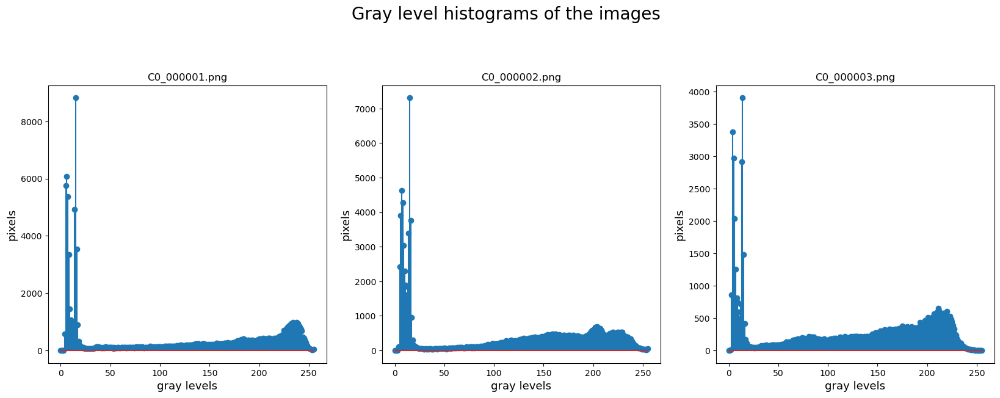

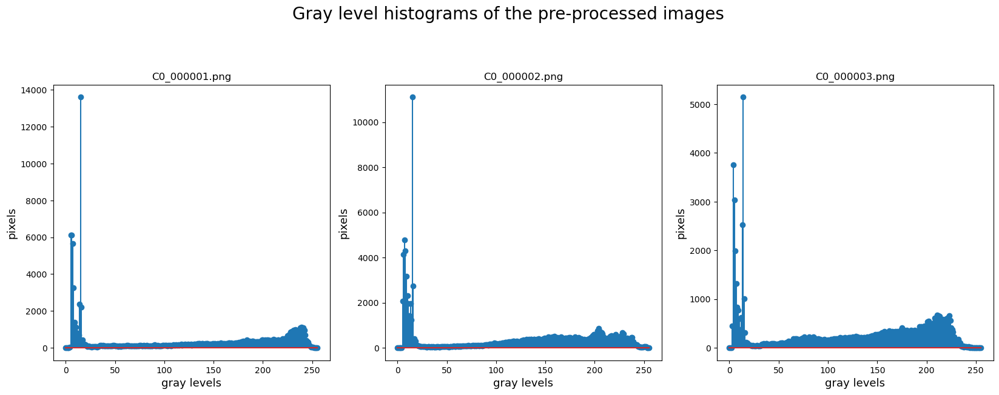

In [11]:
plot_histogram_grid(nir_imgs, nir_names, 'Gray level histograms of the images')
plot_histogram_grid(filtered_images, nir_names, 'Gray level histograms of the pre-processed images')

# 03 Segmentation by Binarization
In order to compute the binary mask that outlines the fruit image, segmentation through binary tresholding is applied.

In particular, four different methods are taken into consideration and compared in terms of time performances, robustness and quality of the output.

The considered methods are:
- *Manual Binarization by Intensity Thresholding*;
- *Otsu's Algorithm*;
- *A tweaked version of Otsu's Algorithm*;
- *Adaptive Thresholding*.

For each technique (Except *Adaptive Thresholding*, which uses a slightly different approach) the pipline to obtain the mask of a fruit is the following:
1. An initial mask of the fruit is obtained by thresholding the NIR image through a specific method in order to remove the background;
2. The possible holes present inside the mask of the fruit are removed through a flood-fill approach:
    - The mask is padded by one-pixel-unit on each dimension with intensities equal to the ones of the background ($0$). This procedure guarantees that if a fruit overflows the borders of the image the flood-filling operation is still applied correctly;
    - The mask is flood-filled with colour the same colour as the one of the foreground region ($255$), this way solely the holes are visible with intensity $0$;
    - The padding is removed and the colours of the mask inverted. Thus, the holes end up having an intensity of $255$, which is the same colour as the one of the foreground region in the mask computed at point 1;
    - A *bit-wise addition* between the mask computed at the previous point and the one obtained at point 1 is performed, thus resulting in a mask where the region of the fruit (the foreground) has intensity $255$ and no holes.

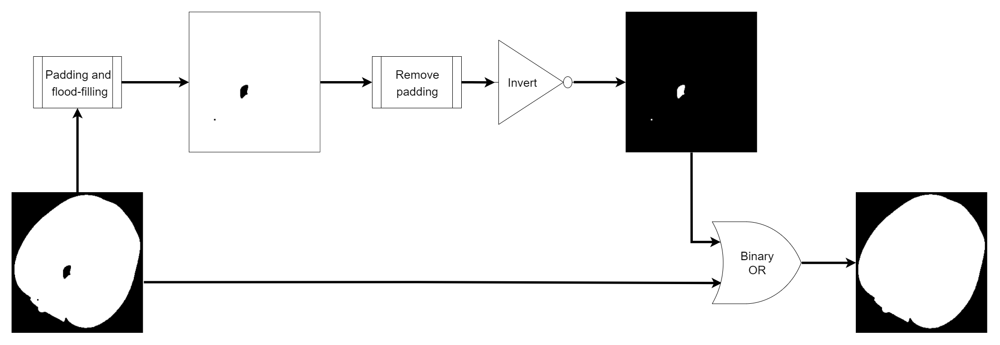

## 03.1 Manual Intensity Tresholding
This first approach is the simplest and faster. A global treshold $t$ is manually provided in order to segment the image $I$ by transforming each of its pixels $(i,j)$, such that:

$$\forall i,j, \ I(i,j) = 
\begin{cases} 
    0, & \text{if} \ I(i,j) \leq t \\
    255, & \text{otherwise}
\end{cases}$$

Where $0$ corresponds to background pixels and $255$ to foreground pixels.

As previously explained, finding such treshold is not trivial given that the gray-level histogram is not bimodal.
Various experiments have shown that a good value of this treshold that guarantees a good binarization is found in the range $[20-50]$ and the value of $50$ was finally chosen for $t$.

The results of this method are satisfactory since a precise outline of each fruit is obtained. Moreover, the time taken to compute the segmentation is just $\approx 0.0003$ seconds per image.

Using a global threshold that is the same for each image is possible in this kind of system, since the assumption of the presence of uniform and costant illumination is valid. However, the system is a bit too rigid and finding a global threshold for each image would be more robust to small possible changes of intensity.

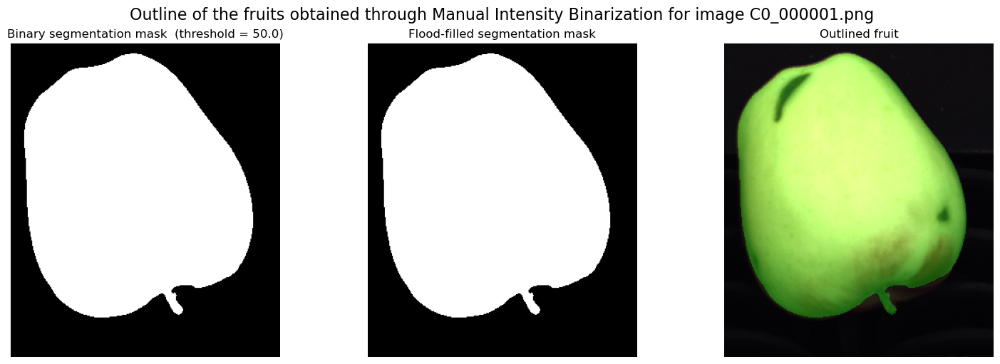

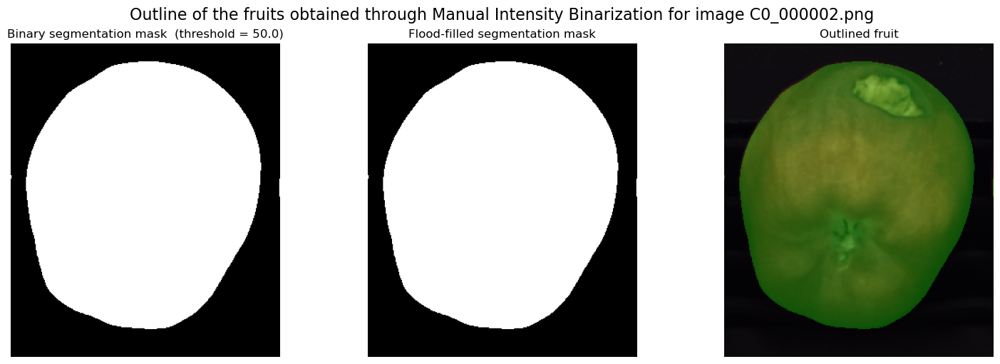

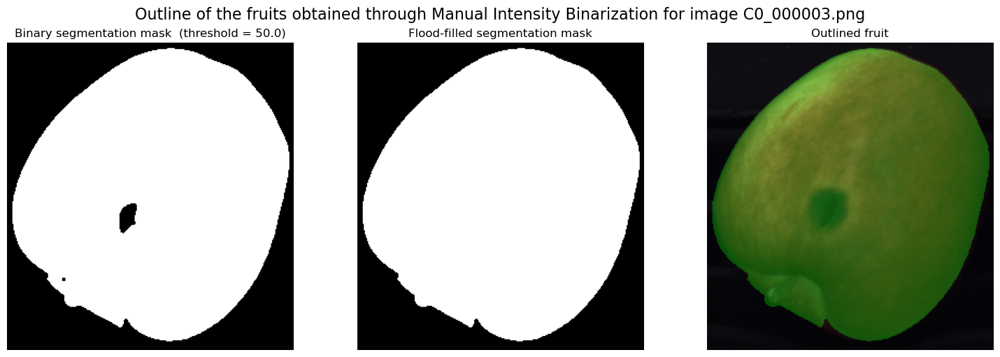

In [12]:
MANUAL_THRESHOLD = 50
plot_segmentation_process(filtered_images, colour_imgs, nir_names, ThresholdingMethod.MANUAL, threshold=MANUAL_THRESHOLD)

In [13]:
REPEATS = 1_000

In [14]:
total_manual_time, mean_manual_time = get_segmentation_time(
    filtered_images, ThresholdingMethod.MANUAL, threshold=MANUAL_THRESHOLD, repeats=REPEATS)

Total time to perform Manual Intensity Binarization on 3000  images = 1.019283
Mean time per instance to perform Manual Intensity Binarization = 0.000340


## 03.2 Otsu's Algorithm
As an alternative approach, *Otsu's Algorithm* is tested. It computes for each image a different global threshold $t$ that divides two *maximally homogeneous regions*. 

These regions are chosen in a way such that their *within-group variance* ($\sigma_W^2$) is minimal. In other words, the sum of the weighted variance of the two maximally omogeneous regions divided by $t$ should be minimal. The two variances are weighted according to the number of pixels in each region.

The algorithm uses an equivalent and faster approach by maximizing the so called *between-group variance* ($\sigma_B^2$) of the two regions. This value indicates, in fact, how well they are separated. The segmentation of an image $I$ is then performed according to the obtained threshold $t$ as in the previous case.

Due to the nature of the algorithm, that computes a cost function between two regions, Otsu's algorithm should be robust to small changes of intensity in the images.

Unfortunately, The results of this method are particularly bad and darker regions of the fruits are classified as "background". It looks like pixels of that area are closer to the ones of the background, thus a higher threshold $t$ than the best one is obtained in order to maximize $\sigma_B^2$.

Regarding the given instances, the quality of the segmentation could be considered sufficient, since the defects are all present between the bounds of the obtained binary masks and they could be all eventually detected in successive steps. However, considering that the aim of the project is to build a system that would be used in an industrial setting, the results cannot be considered valid. In newly introduced instances defects could still be present in the darker regions of the fruits and *Otsu's Algorithm* may not be able to provide a binary segmentation that includes them. Hence, these defects would be unnoticed.

On a better note, the average time taken to compute the segmentation of an image is comparable to the one of *Binarization by Intensity Thresholding*, with $\approx 0.0004$ seconds per image.

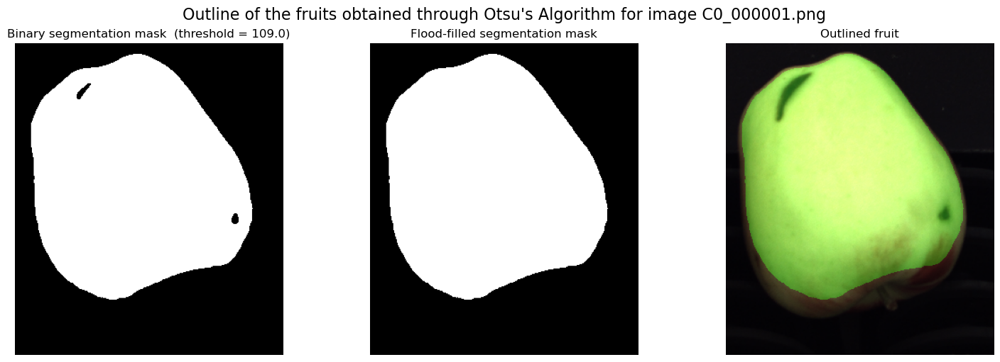

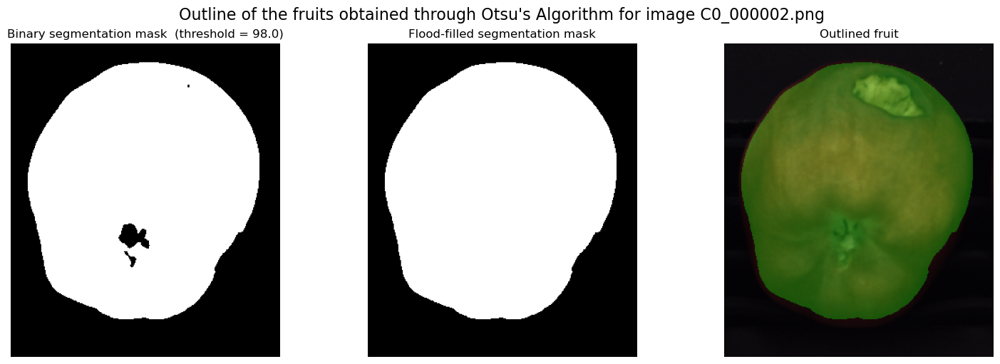

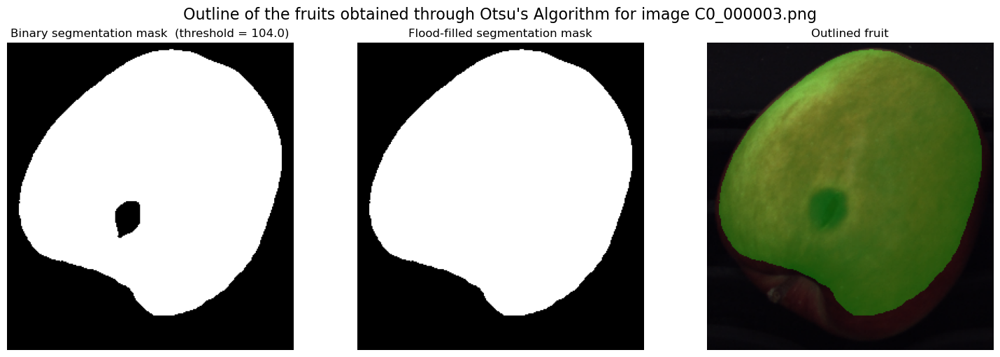

In [15]:
plot_segmentation_process(filtered_images, colour_imgs, nir_names, ThresholdingMethod.OTSU)

In [16]:
total_otsu_time, mean_otsu_time = get_segmentation_time(
    filtered_images, ThresholdingMethod.OTSU, repeats=REPEATS)

Total time to perform Otsu's Algorithm on 3000  images = 1.276336
Mean time per instance to perform Otsu's Algorithm = 0.000425


## 03.3 Tweaked Otsu's Algorithm
As previously observed, *Otsu's Algorithm* positive aspects reside on its speed and on the fact that it computes a global threshold $t$ which is different for each image for an increased robustness in changes of intensity of light.

Nonetheless, on the given instances it is not able to provide a global threshold which outlines the fruit correctly.

In order to exploit its benefits while improving its performance a new simple algorithm is proposed which will be called *Tweaked Otsu's Algorithm*.

Given an image $I$, it obtains a global threshold $t$ using *Otsu's Algorithm* and then it multiplies it by a *tweak factor* in order to decrease (or increase) its value obtaining a new threshold $t'$. 
$$t = \texttt{otsu}(I)$$
$$t' = t \cdot \text{tweak factor}$$

In such a way a better segmentation of the fruit can be obtained according to $t'$, while maintaining the robustness to different light intensities by computing the threshold on each image and not as a global value.

For the task, a *tweak factor* of value $0.3$ has been chosen. The results obtained through this approach are optimal as the whole fruit is segmented from the background in its entirety in each image.

Furthermore, the time taken to segment each image is comparable to the one of *Otsu's Algorithm* and *Binarization by Intensity Thresholding*, namely $\approx{0.0005}$ seconds.

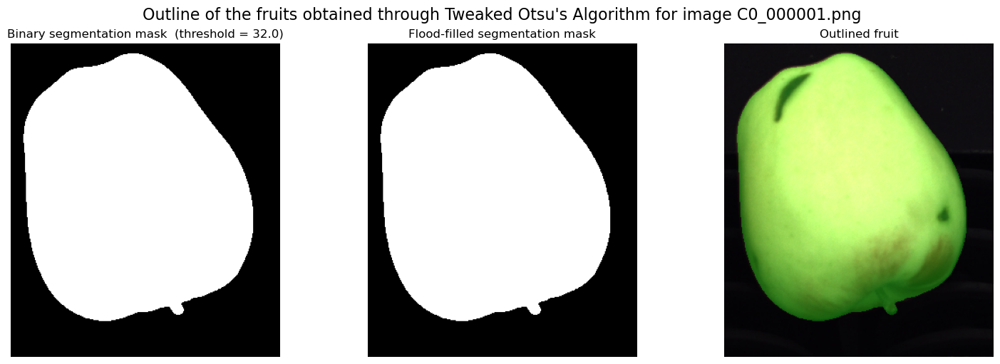

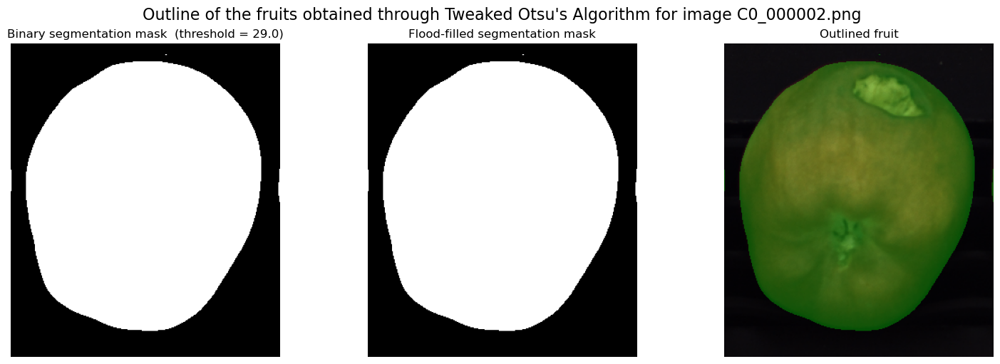

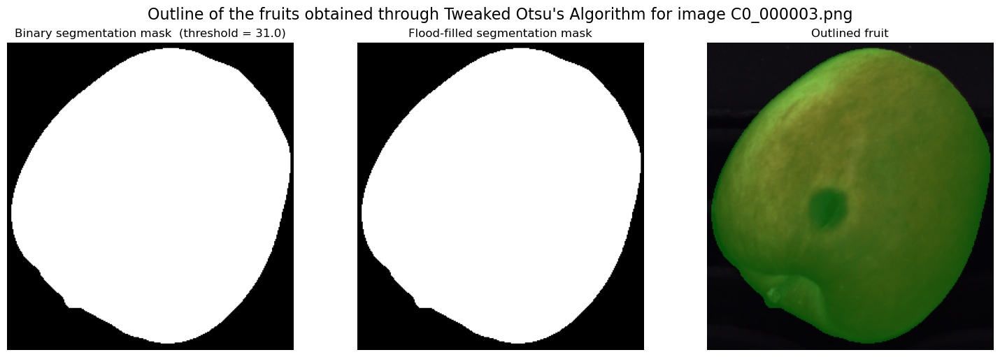

In [17]:
TWEAK_FACTOR = .3
plot_segmentation_process(filtered_images, colour_imgs, nir_names, ThresholdingMethod.TWEAKED_OTSU, tweak_factor=TWEAK_FACTOR)

In [18]:
total_tweaked_otsu_time, mean_tweaked_otsu_time = get_segmentation_time(
    filtered_images, ThresholdingMethod.TWEAKED_OTSU, tweak_factor=TWEAK_FACTOR, repeats=REPEATS)

Total time to perform Tweaked Otsu's Algorithm on 3000  images = 1.422998
Mean time per instance to perform Tweaked Otsu's Algorithm = 0.000474


## 03.4 Local Adaptive Thresholding
As a final approach the *Local Adaptive Thresholding* method is tested. Differently from previous algorithms, it does not compute a global threshold to segment the image. Instead, it computes a threshold for each pixel of the image according to a window of pixels around it, called *neighbourhood*. This technique deals efficiently with non-uniformely illuminated scenes.

The threshold of each pixel $p$ in an image $I$, $t(p)$ is computed by a fast operator, that chooses as a threshold the mean of the neighbourhood of $p$ ($\mu(N_p)$). Moreover a constant $C$ can be subtracted from the result in order to improve it. This last operation is a trick that improves the segmentation when pixels lack background and foreground pixels in their neighbourhood.

$$\forall p \in I, t(p) = \mu(N_p) - C$$

For the given problem a value of $C$ equal to $5$ has been chosen, along with a neighbourhood of size $(11 \times 11)$ for each pixel.

Given the nature of the method which computes a threshold for each pixel, it is expected to be slower than the previously analysed global thresholding methods. In fact it manages to segment an image in around $0.0009$ seconds. A result that is higher than all the previous ones. A further reason of this overhead is even found in the fact that two *flood-fill* opeations have to be carried out. The first is applied to fill the background, which is initially mainly white due to the computation of the threshold at a local level (As seen in the image below). The second is the classic *flood-filling* applied to remove the holes from the white mask.

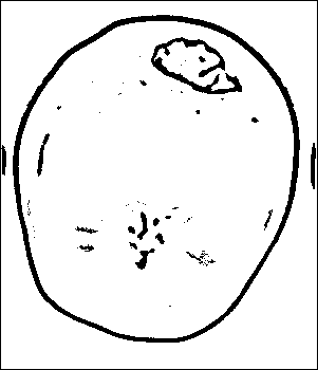

However, the method manages to precisely segment the fruit even if small light changes are present around its lower part. Nonetheless, applying a local thresholding method in a system where the assumption of uniform illumination is present, such as the one of this project, is excessive. As previously observed, the *Tweaked Otsu's Algorithm* and the *Manual Intensity binarization* methods are able to obtain equivalently good results in less time.

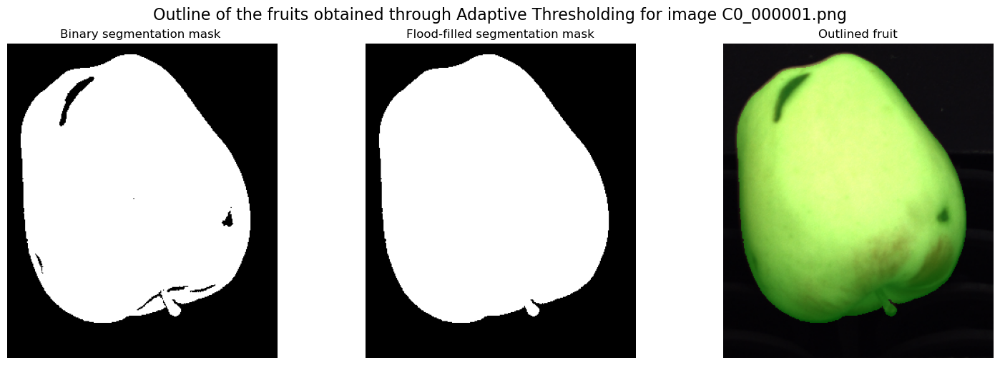

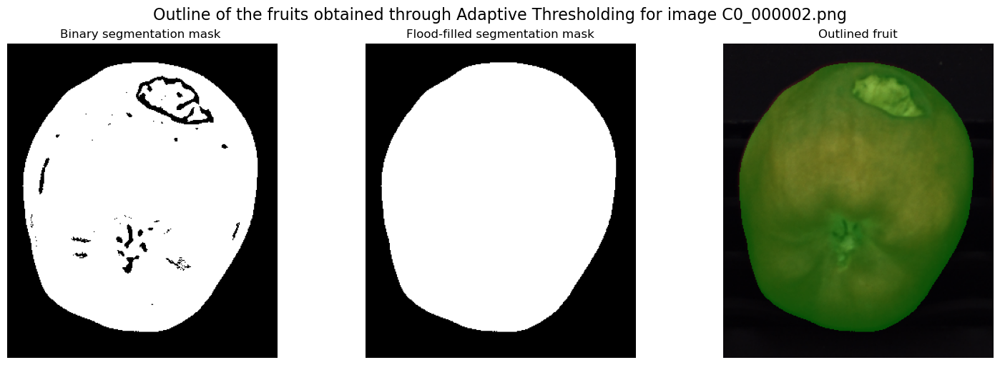

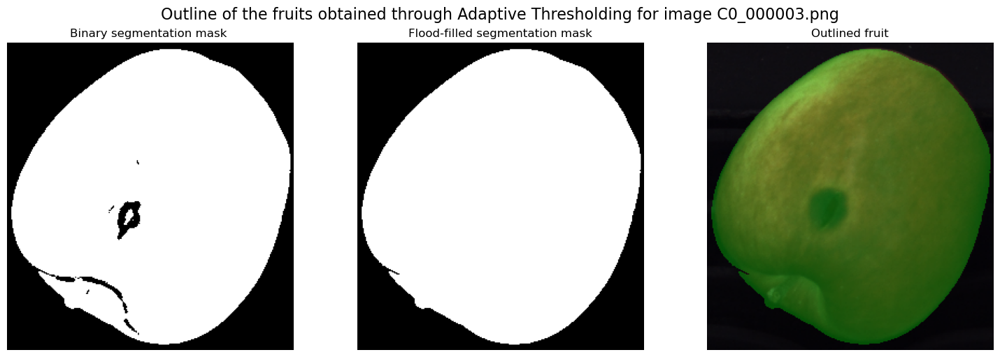

In [19]:
BLOCK_SIZE = 11
C = 5

plot_segmentation_process(filtered_images, colour_imgs, nir_names, ThresholdingMethod.ADAPTIVE, 
                     block_size=BLOCK_SIZE, c=C)

In [20]:
total_adaptive_time, mean_adaptive_time = get_segmentation_time(
    filtered_images, ThresholdingMethod.ADAPTIVE, block_size=BLOCK_SIZE, c=C, repeats=REPEATS)

Total time to perform Adaptive Thresholding on 3000  images = 2.580985
Mean time per instance to perform Adaptive Thresholding = 0.000860


## 03.5 Comparisons of the Algorithms
The table sums up the characteristics of the tested thresholding algorithms in terms of quality, speed and robustness. 

|                | Manual Intensity Binarization | Otsu's Algorithm | Tweaked Otsu's Algorithm | local Adaptive Thresholding |
| :------------- | :---------------------------: |  :-------------: | :----------------------: | :-------------------------: |
| **Quality**    |             High              |        Low       |           High           |             High            |
| **Speed**      |            Fastest            |        Fast      |           Fast           |             Slow            |
| **Threshold individual for each image** |  No  |        Yes       |           Yes            |             Yes             |

*Manual Intensity Binarization* is the fastest method, followed by *Otsu's Algorithm* and *Tweaked Otsu's Algorithm* wihich speed is still great, but not as the first method. On the other hand *Local Adaptive Thresholding* is the slowest between all methods.

In terms of quality of segmentation, high quality results are obtained by all methods except for *Otsu's Algorithm*.

Regarding the robustness of the methods, all of them can deal with changes of illumination in the scene, except *Manual Intensity Binarization*, which provides a threshold which is equal for all the images, and is thus not robust.

*Tweaked Otsu's Algorithm* is hence considered the best method to apply for the segmentation task.

The chart below shows the total time to segment $3,000$ images with each method along with the mean time taken per image.

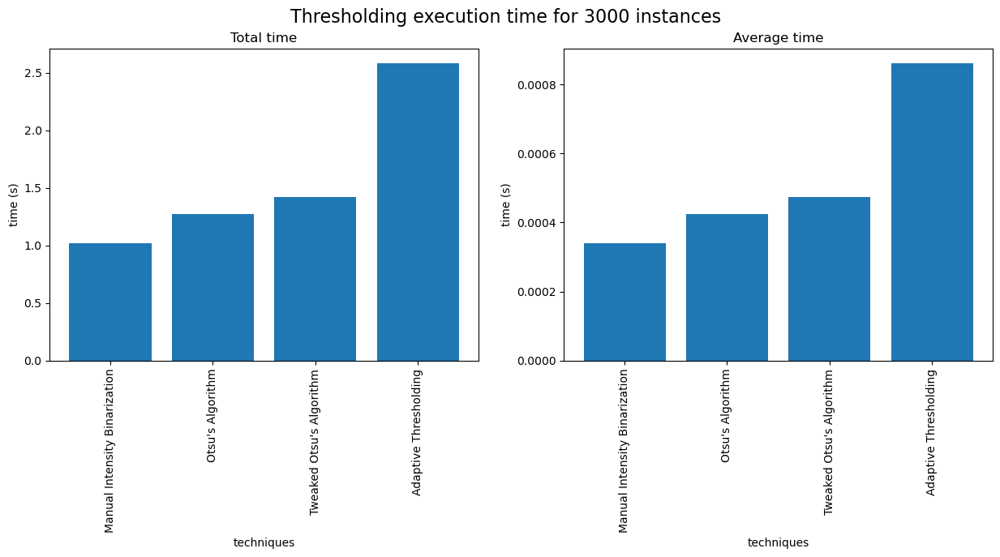

In [21]:
labels = ['Manual Intensity Binarization', "Otsu's Algorithm", "Tweaked Otsu's Algorithm", 'Adaptive Thresholding']

ys_tot = [total_manual_time, total_otsu_time, total_tweaked_otsu_time, total_adaptive_time]
ys_mean = [mean_manual_time, mean_otsu_time, mean_tweaked_otsu_time, mean_adaptive_time]
xs = np.arange(len(labels))

fig, axes = plt.subplots(1, 2, figsize=(15,5))

axes[0].bar(xs, ys_tot, align='center')
axes[1].bar(xs, ys_mean, align='center')

for ax in axes:
    ax.set_xticks(xs, labels, rotation=90)
    ax.set_xlabel('techniques')
    ax.set_ylabel('time (s)')

axes[0].set_title('Total time')
axes[1].set_title('Average time')

fig.suptitle('Thresholding execution time for 3000 instances', fontsize=16)

plt.show()

## 03.6 Segmentation Results
The masks obtained through *Tweaked Otsu's Algorithm* are finally applied over the Near Infra-Red images, the Near Infra-Red images pre-processed by *Median Blur* and the colour images and the results are plotted. 

In [22]:
masks = [get_fruit_segmentation_mask(img, ThresholdingMethod.TWEAKED_OTSU, tweak_factor=TWEAK_FACTOR) 
         for img in filtered_images]

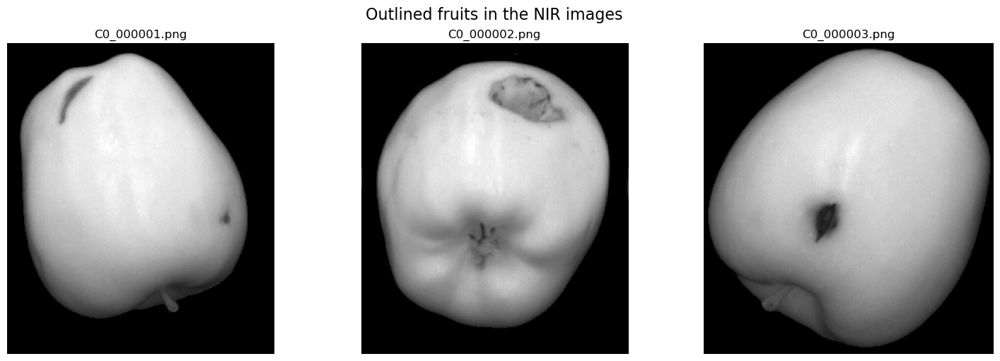

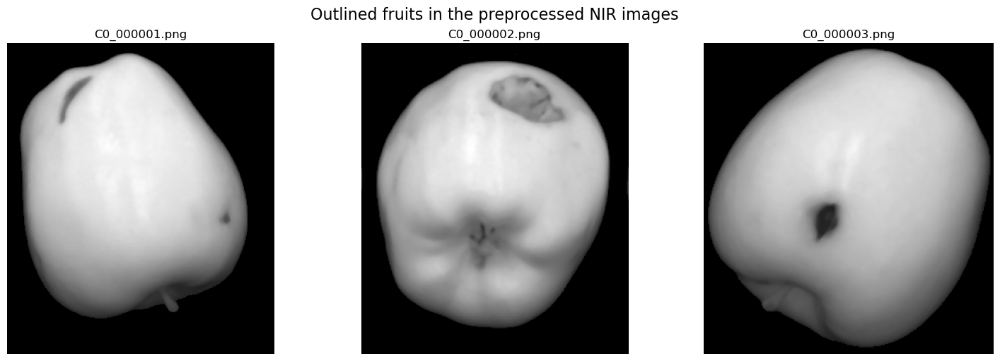

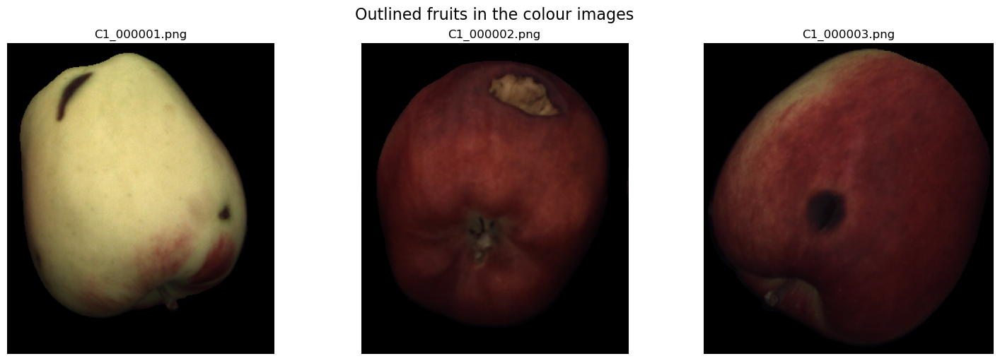

In [23]:
masked_nir_imgs = [apply_mask_to_image(img, m) for img, m in zip(nir_imgs, masks)]
masked_filtered_imgs = [apply_mask_to_image(img, m) for img, m in zip(filtered_images, masks)]
masked_colour_imgs = [apply_mask_to_image(img, m) for img, m in zip(colour_imgs, masks)]

plot_image_grid(masked_nir_imgs, nir_names, 'Outlined fruits in the NIR images')
plot_image_grid(masked_filtered_imgs, nir_names, 'Outlined fruits in the preprocessed NIR images')
plot_image_grid(masked_colour_imgs, colour_names, 'Outlined fruits in the colour images')

# 04 Defects identification
After the segmentation of the fruit from the background is performed the second part of the task is addressed. It consists in identifying the defects on the masked fruits.

Judging by the pictures of the fruits, the defects present strong edges, therefore an edge extraction algorithm would be ideal to identify them.

This second part of the task is divided in the following steps for each image:
- Obtaining an edge mask through *Canny's edge extraction method*;
- Filling the edges of the defects, obtaining a blob for each edge;
- Cleaning-up the edge mask from noisy artefacts. 

## 04.1 Edge Extraction
In order to extract the edges, *Canny's method* is applied to the filtered and masked Near Infra-Red images.

The method proposed by Canny consists in the following steps:
- The image is filtered through a *Gaussian filter*, leveraging on the separability of the Gaussian function to speed-up the computations. He showed that for 1D vectors (where edges are considered noisy steps) the filtering operations lead to the best detection of edges. The same concept applies for 2D matrices, namely images.
- Then, a *Sobel kernel* filtering operation in both horizontal and vertical directions is performed in order to get the first derivatives of each pixel in both directions ($G_x, G_y$). From these values the *Edge Gradient* and the *Gradient directions* are obtained.
$$\text{Edge Gradient}(G) = \sqrt{G_x^2 + G_y^2}$$
$$\text{Gradient  Direction}(\theta) = \tan^{-1} \left( \frac{G_y}{G_x}\right)$$
- *Non-Maxima Suppression* is applied. For every pixel it is checked whether it is a local maximum in its neighborhood in the direction of gradient. The pixel is kept as an edge point if that occurs, otherwise it is discarded.
- *Hysteresis* is finally executed to furtherly filter actual edge points. It makes use of two thresholds: a higher one $t_h$ and a lower one $t_l$. Pixels with intensity gradient above or equal to $t_h$ are considered edge points, while pixels with intensity gradient below $t_l$ are discarded. Pixels who lie between these two thresholds are classified as edges if and only if they are connected to "sure-edge" pixels.

*Canny's method* implementation in `OpenCV` does not perform the initial *Gaussian Smoothing*, therefore the operation was manually applied with a value of $\sigma$ = 1 and a kernel size computed by a rule-of-thumb:
$$k = \left\lceil 3 \cdot \sigma \right\rceil$$
$$\text{kernel size} = (2 \cdot k + 1 \times 2 \cdot k + 1)$$

Regarding the *hysteresis* thresholds, the best results have been obtained with $t_h = 130$ and $t_l = 60$. 

Below plots of the obtained edge masks for each fruit are shown.

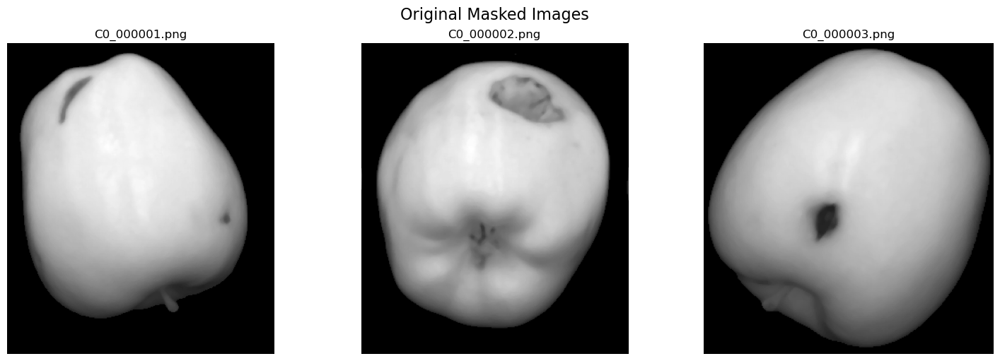

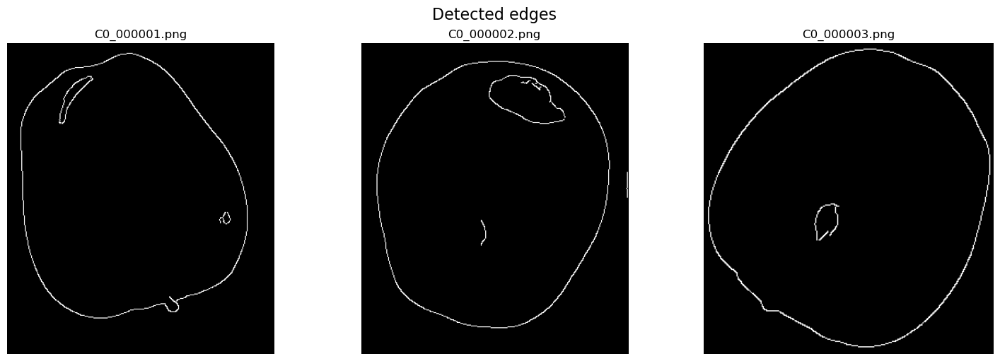

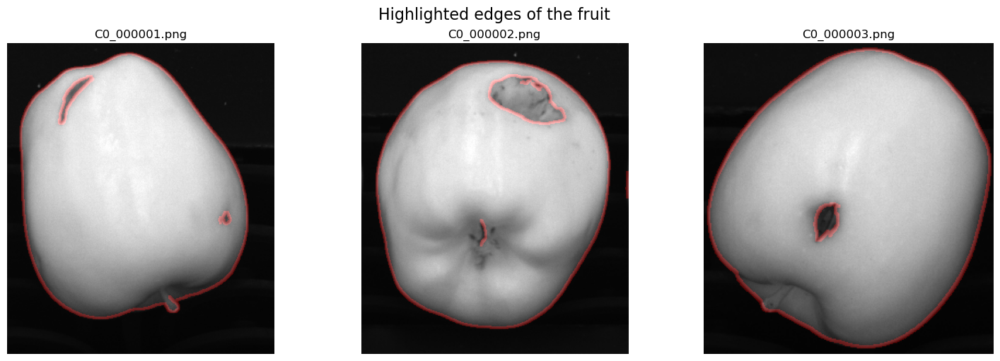

In [24]:
SIGMA = 1
THRESHOLD_1 = 60
THRESHOLD_2 = 130

edge_masks = [apply_gaussian_blur_and_canny(img, SIGMA, THRESHOLD_1, THRESHOLD_2) for img in masked_filtered_imgs]

highlighted_edges_images = [get_highlighted_edges_on_image(img, e) for img, e in zip(nir_imgs, edge_masks)]

plot_image_grid(masked_filtered_imgs, nir_names, 'Original Masked Images')
plot_image_grid(edge_masks, nir_names, 'Detected edges')
plot_image_grid(highlighted_edges_images, nir_names, 'Highlighted edges of the fruit')

To remove the edges along the border of the fruit the binary masks have been eroded by a rectangular *structuring element* of size $15 \times 15$ and then applied over the edge mask.

Thanks to this operation, solely the edges of the defects, along with some noisy artifacts, are preserved.

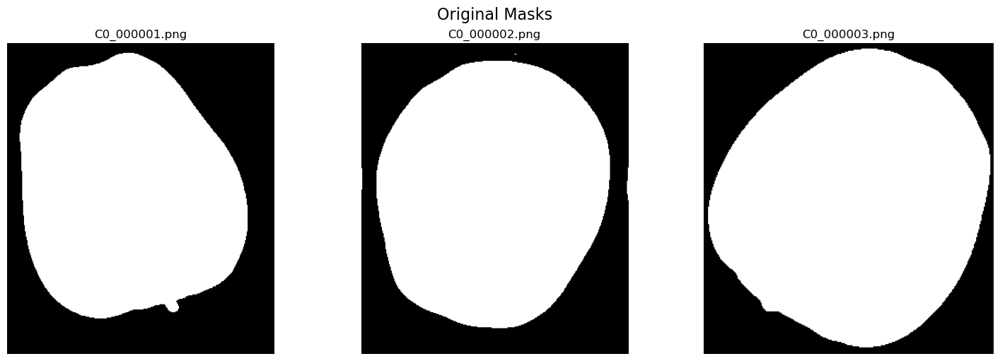

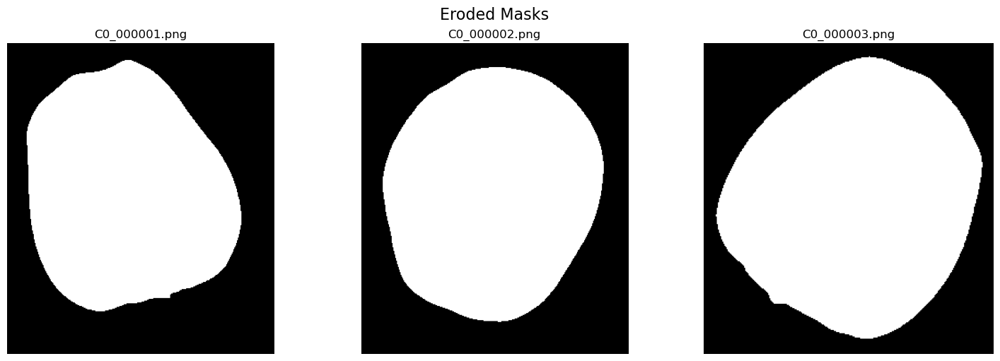

In [25]:
element = cv.getStructuringElement(cv.MORPH_RECT, (15, 15))
eroded_masks = [cv.erode(img, element) for img in masks]

plot_image_grid(masks, nir_names, 'Original Masks')
plot_image_grid(eroded_masks, nir_names, 'Eroded Masks')

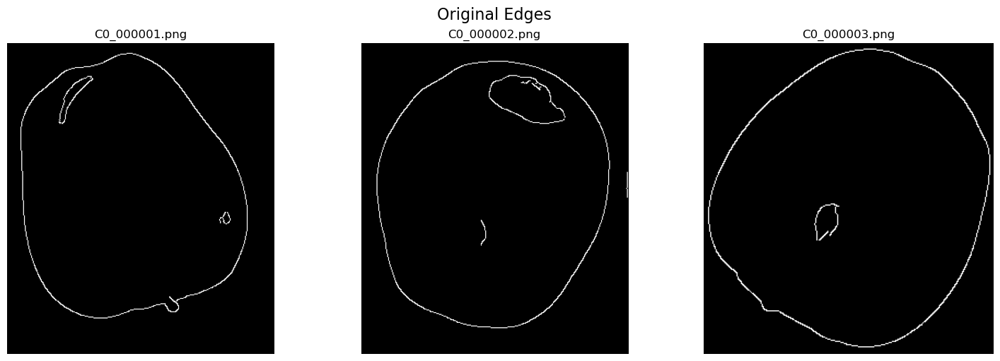

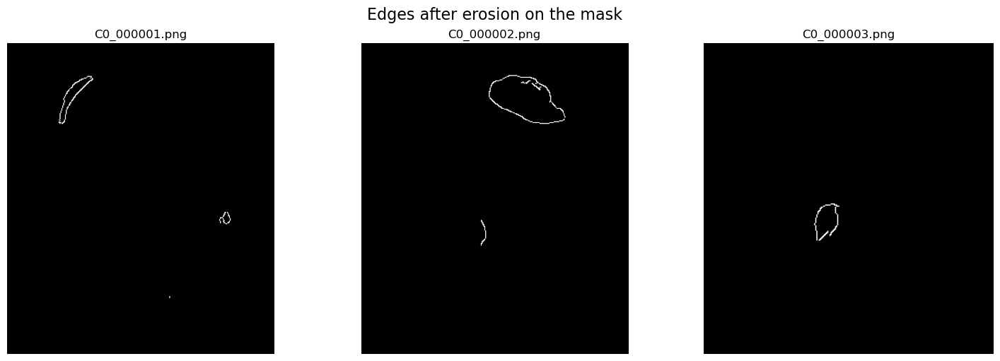

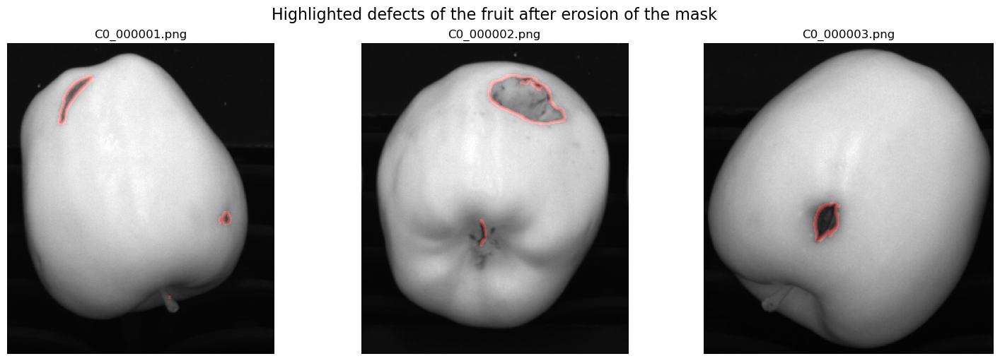

In [26]:
eroded_edge_masks = [apply_mask_to_image(m1, m2) for m1, m2 in zip(edge_masks, eroded_masks)]
highlighted_edges_images = [get_highlighted_edges_on_image(img, e) for img, e in zip(nir_imgs, eroded_edge_masks)]

plot_image_grid(edge_masks, nir_names, 'Original Edges')
plot_image_grid(eroded_edge_masks, nir_names, 'Edges after erosion on the mask')
plot_image_grid(highlighted_edges_images, nir_names, 'Highlighted defects of the fruit after erosion of the mask')

## 04.2 Defects Filling
In order to fill the edges of the defects in the edge mask and obtain a blob in correspondence of each defect, a *Closing* operation with a circular structuring element of size $50 \times 50$ was applied.

The results are shown below. As it can be observed, the blobs in correspondence of the defects are obtained even if some noisy artifacts remain.

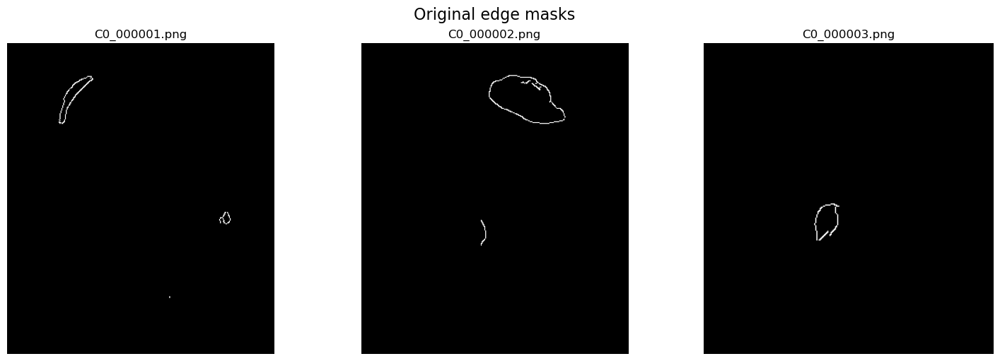

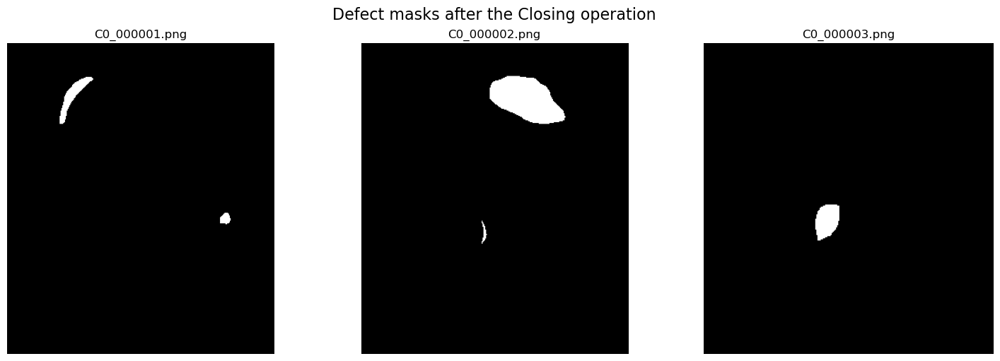

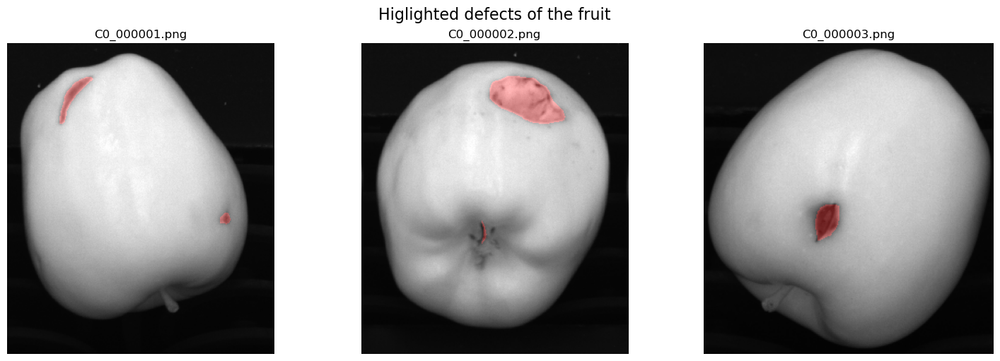

In [27]:
element = cv.getStructuringElement(cv.MORPH_ELLIPSE, (50, 50))
defect_masks = [cv.morphologyEx(img, cv.MORPH_CLOSE, element) for img in eroded_edge_masks]
highlighted_defects = [get_highlighted_roi_by_mask(img, e, 'red') for img, e in zip(nir_imgs, defect_masks)]

plot_image_grid(eroded_edge_masks, nir_names, 'Original edge masks')
plot_image_grid(defect_masks, nir_names, 'Defect masks after the Closing operation')
plot_image_grid(highlighted_defects, nir_names, 'Higlighted defects of the fruit')

To remove the noisy artifacts a *Median Blur* of kernel $7 \times 7$ is performed. The idea behind this operation is that small artefacts can be considered as some kind of *impulse noise*. Hence, a median filter is able to remove them while preserving the structure of the blobs in correspondence of the defects.

The final cleaned-up edge mask can be seen below.

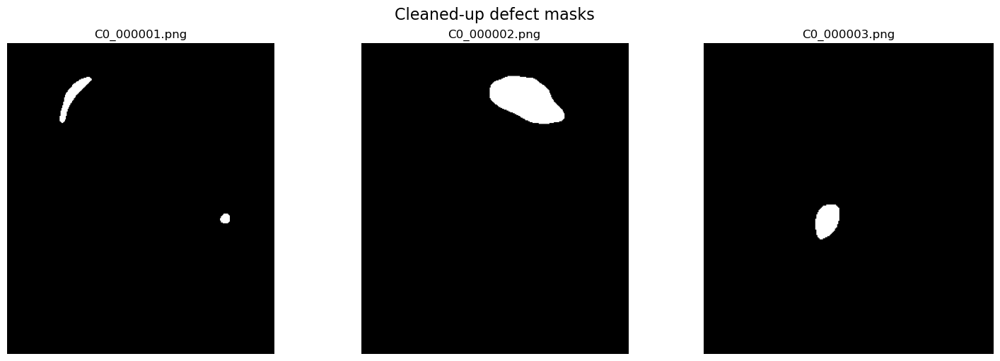

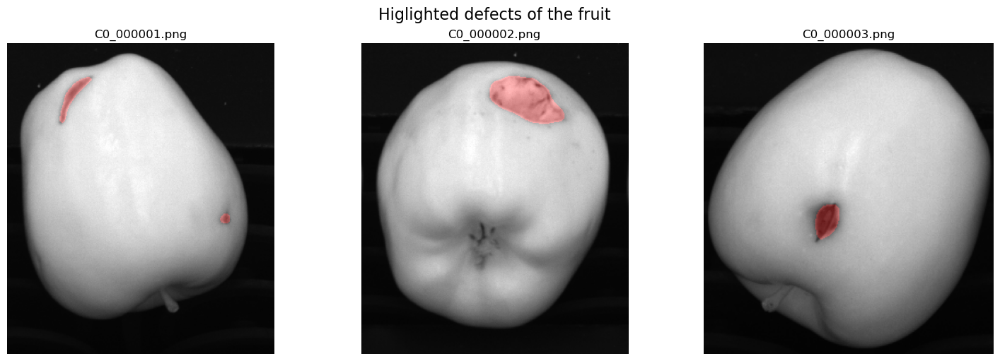

In [28]:
defect_masks = [cv.medianBlur(m, 7) for m in defect_masks]
highlighted_defects = [get_highlighted_roi_by_mask(img, e, 'red') for img, e in zip(nir_imgs, defect_masks)]

plot_image_grid(defect_masks, nir_names, 'Cleaned-up defect masks')
plot_image_grid(highlighted_defects, nir_names, 'Higlighted defects of the fruit')

## 05 Results
An algorithm performing the steps described above is built in `src/execute_first_task.py` and it can be executed via command line or by the method `detect_defects`. 

The algorithm:
- Filters the image by *Median Blur* with a kernel $5 \times 5$;
- Applies *Tweaked Otsu's Algorithm* to obtain the segmented fruit;
- Uses *Canny's Algorithm* by firstly blurring the masked image through *Gaussian Blur*;
- It obtains the defect blobs by the edge mask and removes the noisy artifacts;
- Shows the blobs of the defects, counts their occurrences and highlights their position through ellipses;
- Returns statistics about the defects.

Once again, it can be observed that the result on the given images are pretty satisfactory.

Detected 2 defects for image C1_000001.png.


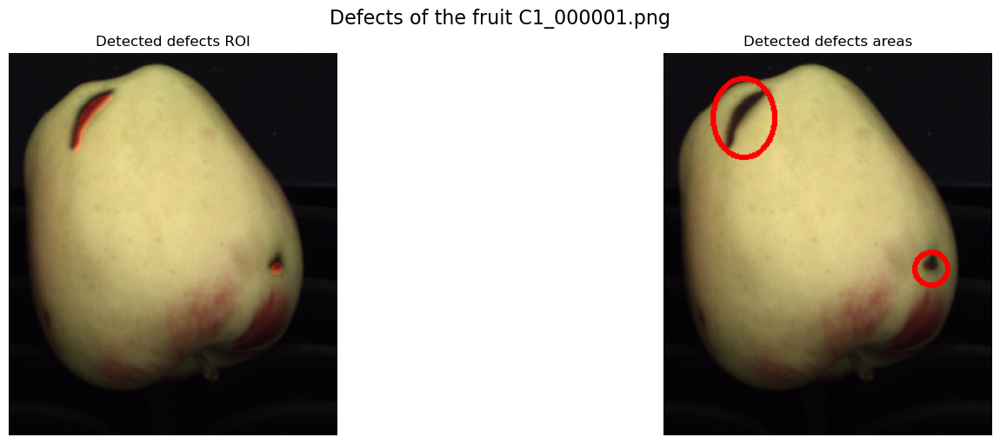

Detected 1 defect for image C1_000002.png.


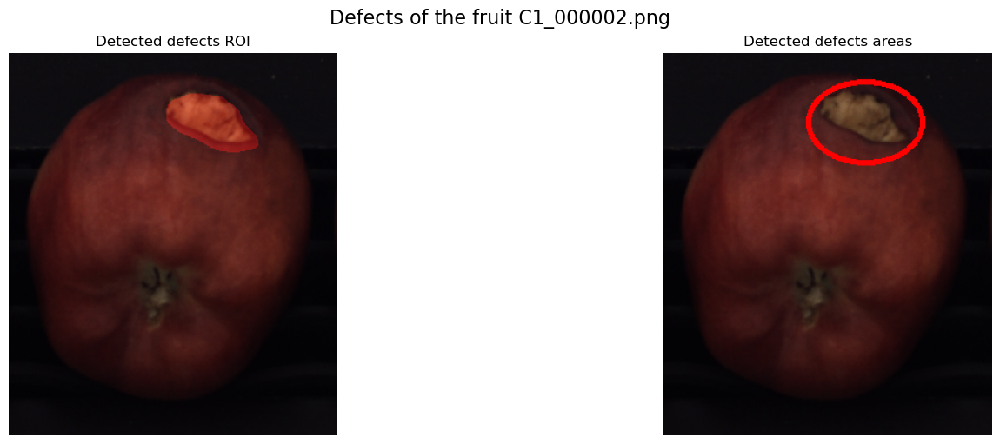

Detected 1 defect for image C1_000003.png.


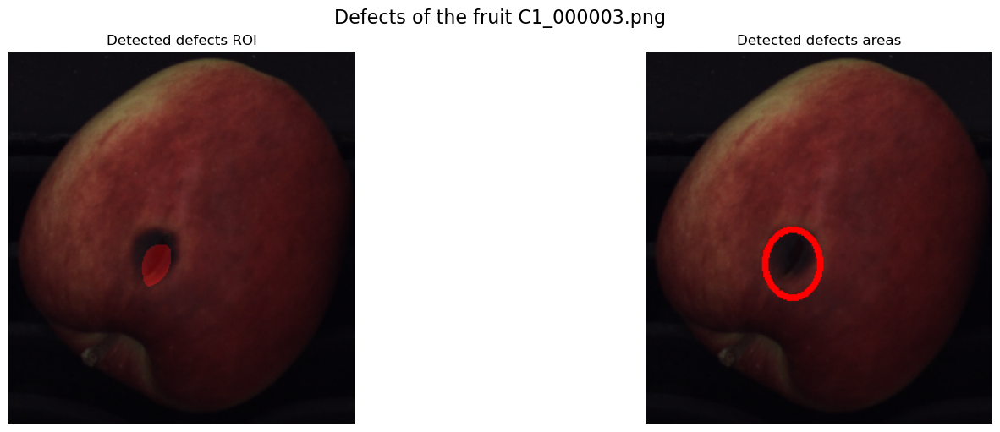

In [29]:
_ = detect_defects(colour_imgs[0], nir_imgs[0], colour_names[0], tweak_factor=TWEAK_FACTOR, sigma=SIGMA,
                   threshold_1=THRESHOLD_1, threshold_2=THRESHOLD_2)
_ = detect_defects(colour_imgs[1], nir_imgs[1], colour_names[1], tweak_factor=TWEAK_FACTOR, sigma=SIGMA,
                   threshold_1=THRESHOLD_1, threshold_2=THRESHOLD_2)
_ = detect_defects(colour_imgs[2], nir_imgs[2], colour_names[2], tweak_factor=TWEAK_FACTOR, sigma=SIGMA,
                   threshold_1=THRESHOLD_1, threshold_2=THRESHOLD_2)

Finally, the time for detecting the defects is computed by applying the `detect_defects` project on each image $1,000$ times, for a total of $3,000$ executions. 

The algorithm is fast, as it can detect the defects of an image with a mean time of $\approx 0.03$ seconds.

In [30]:
s = time()

for col, nir, name in list(zip(colour_imgs, nir_imgs, colour_names)) * 1_000:
    detect_defects(col, nir, name,  tweak_factor=TWEAK_FACTOR, sigma=SIGMA, 
                   threshold_1=THRESHOLD_1, threshold_2=THRESHOLD_2, verbose=False)

total_time = time() - s

In [31]:
print(f'Time for detecting the defects of {1_000 * len(colour_imgs)} images of fruits: {total_time:.6f}')
print(f'Mean time for detecting the defects of an image of a fruit: {(total_time / (1_000 * len(colour_imgs))):.6f}')

Time for detecting the defects of 3000 images of fruits: 80.166541
Mean time for detecting the defects of an image of a fruit: 0.026722


## 05.1 Portability
The system is designed to work in an environment with a uniform and constant illumination, which should apply even for images different than the given ones.

Nonetheless, a robust segmentation method is provided thus the system should adapt easily to environments with different illumination.

The system is easily portable to other industrial settings by simply modifying some of its parameters.
In order to prove so, a version of the colour images and the NIR images with a darker and brighter contrast intensity are computed from the initial images and shown below.

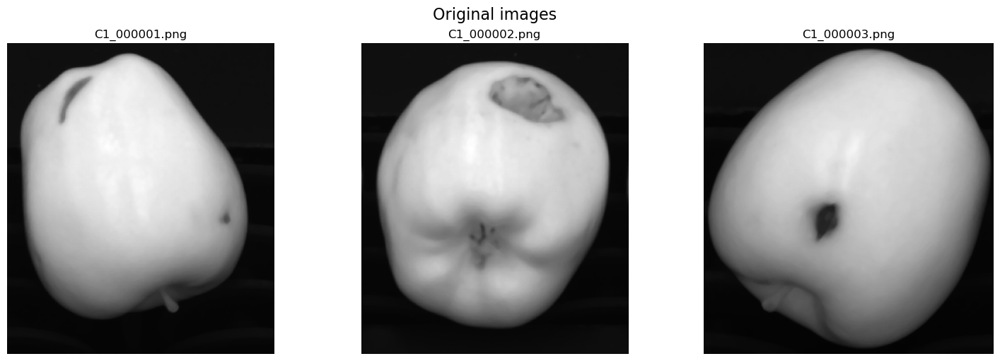

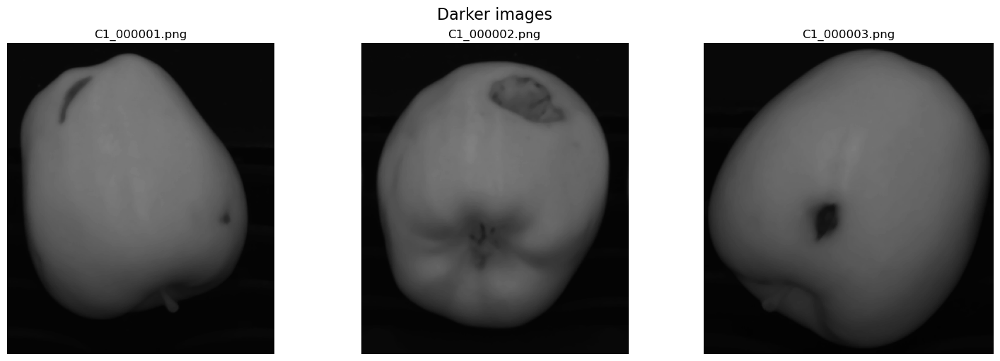

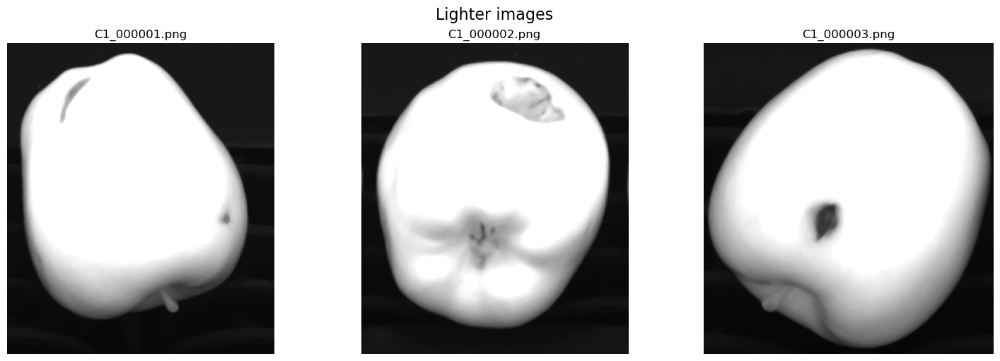

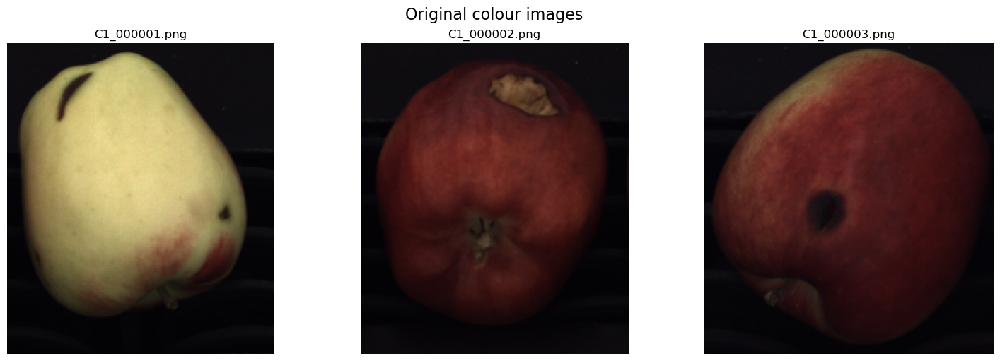

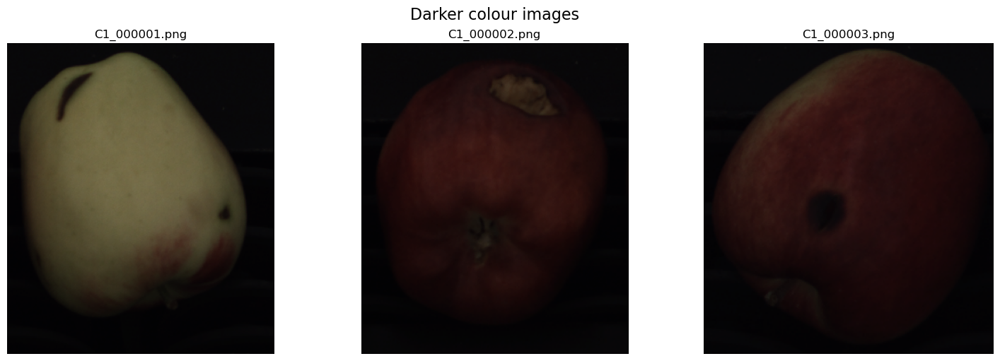

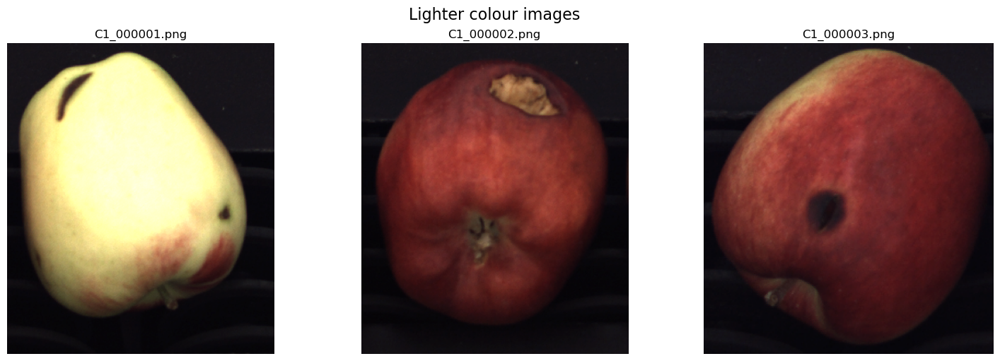

In [32]:
filtered_darker_images = [cv.convertScaleAbs(img, alpha=.5, beta=1) for img in filtered_images]
filtered_lighter_images = [cv.convertScaleAbs(img, alpha=1.5, beta=1) for img in filtered_images]
colour_darker_images = [cv.convertScaleAbs(img, alpha=.5, beta=1) for img in colour_imgs]
colour_lighter_images = [cv.convertScaleAbs(img, alpha=1.5, beta=1) for img in colour_imgs]

plot_image_grid(filtered_images, colour_names, 'Original images')
plot_image_grid(filtered_darker_images, colour_names, 'Darker images')
plot_image_grid(filtered_lighter_images, colour_names, 'Lighter images')

plot_image_grid(colour_imgs, colour_names, 'Original colour images')
plot_image_grid(colour_darker_images, colour_names, 'Darker colour images')
plot_image_grid(colour_lighter_images, colour_names, 'Lighter colour images')

With the same tweak factor and slightly different Canny thresholds ($t_l = 30$ and $t_h = 60$) the defect detection works on darker images.

Detected 2 defects for image Darker C1_000001.png.


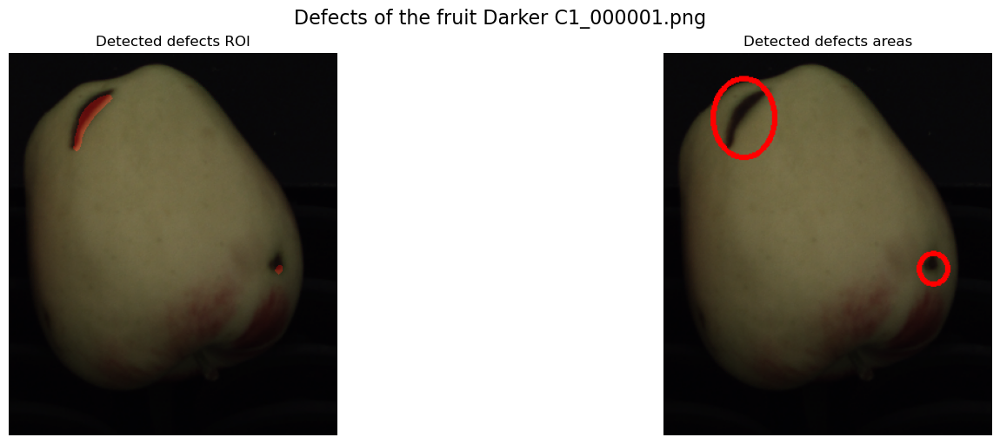

Detected 1 defect for image Darker C1_000002.png.


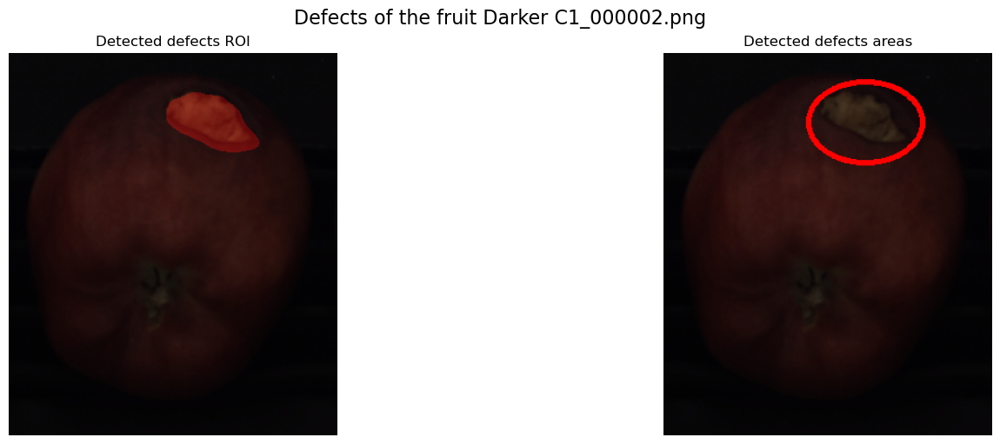

Detected 1 defect for image Darker C1_000003.png.


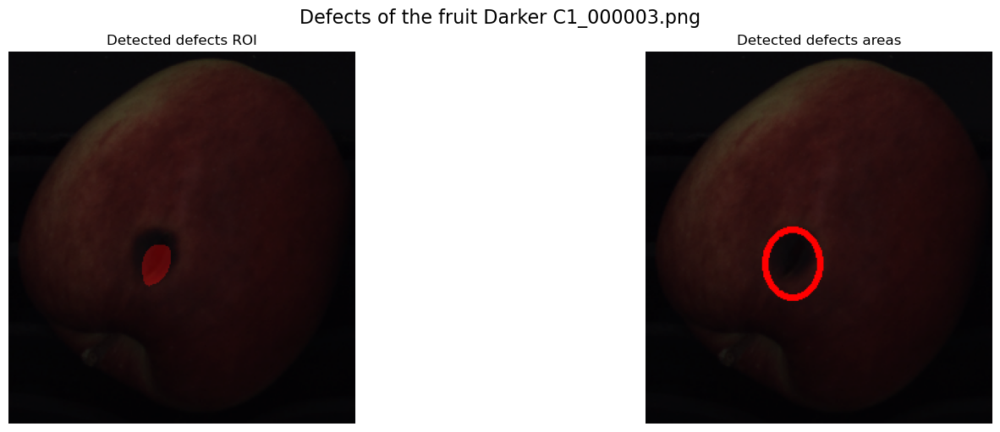

In [33]:
for col, nir, n in zip(colour_darker_images, filtered_darker_images, colour_names):
    detect_defects(col, nir, f'Darker {n}', tweak_factor=TWEAK_FACTOR, sigma=SIGMA,
                   threshold_1=30, threshold_2=60)

With the same tweak factor and slightly different Canny thresholds ($t_l = 80$ and $t_h = 180$) the defect detection works on brighter images.

Detected 2 defects for image Lighter C1_000001.png.


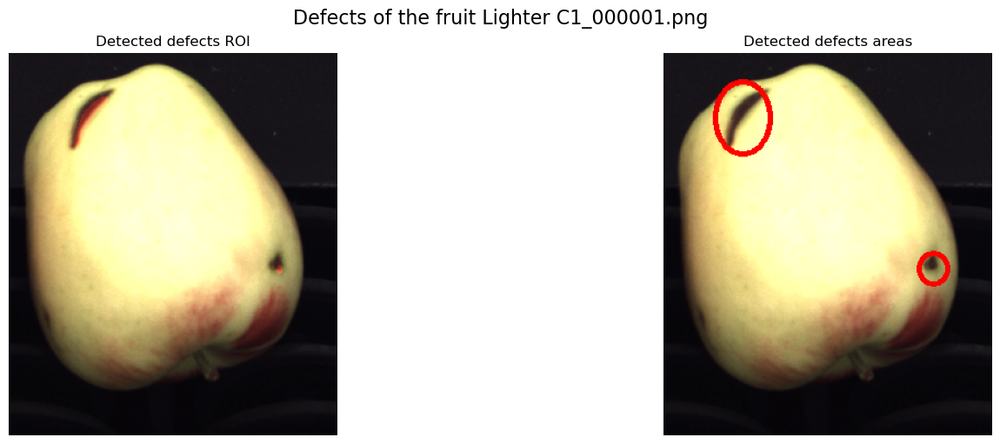

Detected 1 defect for image Lighter C1_000002.png.


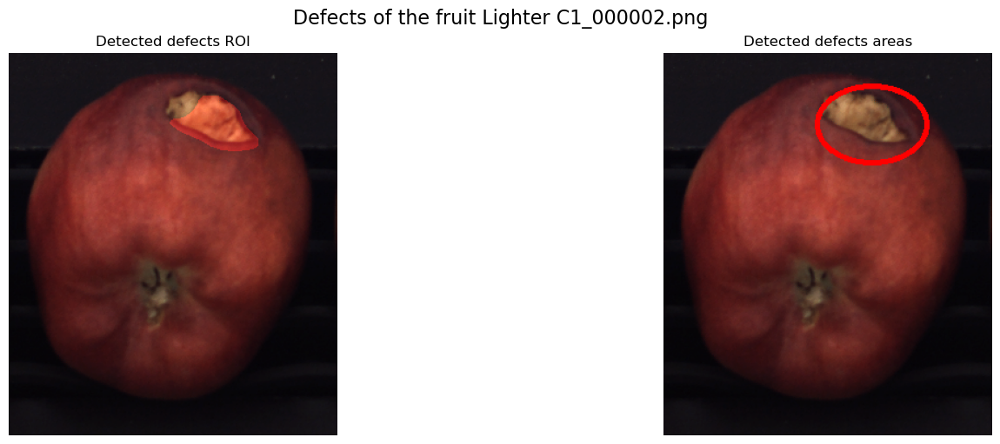

Detected 1 defect for image Lighter C1_000003.png.


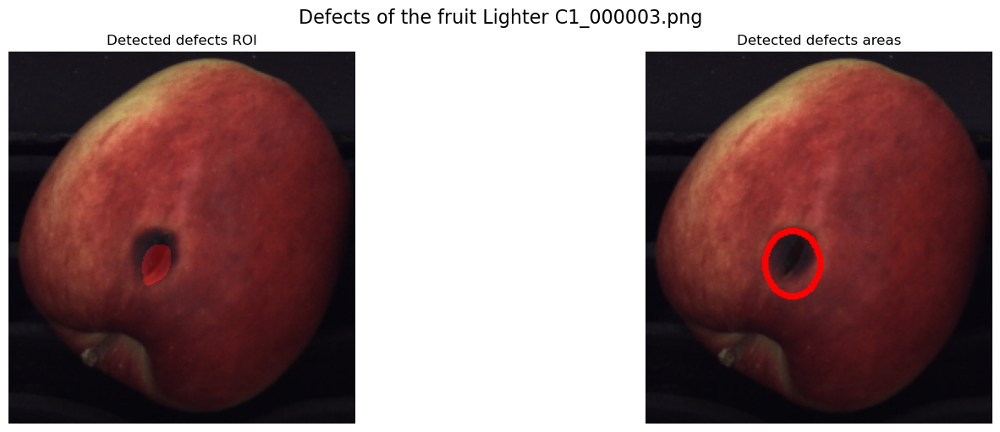

In [34]:
for col, nir, n in zip(colour_lighter_images, filtered_lighter_images, colour_names):
    detect_defects(col, nir, f'Lighter {n}', tweak_factor=TWEAK_FACTOR, sigma=SIGMA,
                   threshold_1=80, threshold_2=180)